## Wavespeed Inference

The basic approach here is to use a second neural network to infer a static x,y field which corresponds to wavespeed and thus ocean depth near shore.

The outputs of this wavespeed NN are used as the squared_slowness calculations in the wavefunction loss terms. 

While the values of the learned wavefunction depend on time, the wavespeed depth field should only be a function of x,y position and tide height. (though for waves breaking on sand it can be expected to change slowly over the course of days as the sandbanks shift) 

TODO: 
1. clean up the train dataset sampling procedure (replace hardcoded time-stepping and increase # of samples per bucket)  

#### Training Notes
1. Model seems to train better, more stably when using non-shuffled data (on a single 30-s chunk, at least)

In [ ]:
import os
os.chdir('/home/erik/work/surfbreak/nbs')

In [ ]:
%load_ext autoreload
%autoreload 2
import torch
import pytorch_lightning as pl
from surfbreak.waveform_models import LitSirenNet

pl.seed_everything(42)

tb_logger = pl.loggers.TensorBoardLogger('logs/', name="wavespeed")
trainer = pl.Trainer(logger=tb_logger, limit_val_batches=3,
                     max_epochs=20, 
                     gpus=1 if torch.cuda.is_available() else None,)

                             # Params from optimization run: fo 2.4967  ho 10.969  ss 0.20492  wfls 5.4719e-9  wsls 0.00043457
wavefunc_model = LitSirenNet('../data/shirahama_1590387334_SURF-93cm.ts', hidden_features=256, hidden_layers=3, first_omega_0=2.5, hidden_omega_0=11, squared_slowness=0.20,
                             steps_per_vid_chunk=100, learning_rate=1e-4, grad_loss_scale=0, wavefunc_loss_scale=5.5e-9, 
                             wavespeed_loss_scale=4e-4, 
                             xrange=(0,400), timerange=(0,3*30), chunk_duration=30, chunk_stride=30)
                             # With default settings wavezone image dimensions are (y=139, x=1515)
trainer.fit(wavefunc_model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type  | Params | In sizes     | Out sizes                   
---------------------------------------------------------------------------------------
0 | model          | Siren | 198 K  | [1, 1337, 3] | [[1, 1337, 1], [1, 1337, 3]]
1 | slowness_model | Siren | 8 K    | ?            | ?                           


/home/erik/.local/lib/python3.6/site-packages/pytorch_lightning/utilities/distributed.py:25: UserWarning:

Detected KeyboardInterrupt, attempting graceful shutdown...

Traceback (most recent call last):


  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)


1

BrokenPipeError: [Errno 32] Broken pipe


In [ ]:
import torch
import pytorch_lightning as pl
from surfbreak.waveform_models import LitSirenNet
model=wavefunc_model
#model = LitSirenNet.load_from_checkpoint('bestlogs/optimized_wide_waveform/checkpoints/epoch=20.ckpt')

In [ ]:
model.hparams

In [ ]:
from surfbreak.datasets import WaveformVideoDataset
wf_valid_video_dataset = WaveformVideoDataset(ydim=120, xrange=(0,130), timerange=model.hparams['timerange'], time_chunk_duration_s=30, 
                                              time_chunk_stride_s=30, time_axis_scale=0.5)

In [ ]:
model_input, ground_truth = wf_valid_video_dataset[2]
model = model.cpu()
wf_values_out, coords_out = model(model_input['coords_txyc'])
wf_values_out.shape, ground_truth['video_txy'].shape

In [ ]:
from surfbreak.train_utils import waveform_tensors_plot
wf_gt_txy = ground_truth['wavefronts_txy']
wf_out_txy = wf_values_out[...,0].detach()

import matplotlib.pyplot as plt
fig = waveform_tensors_plot(wf_out_txy, wf_gt_txy, coords=coords_out)

torch.Size([150, 107, 120]) torch.Size([150, 107, 120])


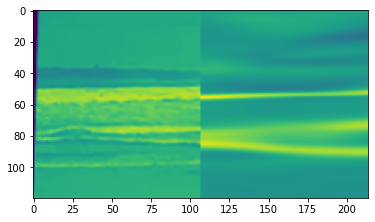

In [ ]:
import matplotlib.pyplot as plt
vid_gt_txy = ground_truth['video_txy']
print(vid_gt_txy.shape, wf_out_txy.shape)
vid_waveform_sidebyside_txy = torch.cat((vid_gt_txy/4, wf_out_txy), dim=1)

#wf_out_xy = wf_out_txy[0,...]
#idx_values = torch.index_select(wf_out_txy, )
plt.imshow(vid_waveform_sidebyside_txy[0].T)

In [ ]:
from surfbreak.supervision import animate_tensor
animate_tensor(vid_waveform_sidebyside_txy.numpy().transpose(2,1,0), colorbar=True)

In [ ]:
from surfbreak.datasets import WaveformVideoDataset
import torch
from surfbreak.waveform_models import LitSirenNet
from surfbreak.supervision import animate_tensor

def animate_model(model, xrange=(200,300)):
    wf_valid_video_dataset = WaveformVideoDataset(ydim=120, xrange=xrange, timerange=model.hparams['timerange'], time_chunk_duration_s=30, 
                                                  time_chunk_stride_s=30, time_axis_scale=0.5)
    model_input, ground_truth = wf_valid_video_dataset[2]
    model = model.cpu().train(False)
    wf_values_out, coords_out = model(model_input['coords_txyc'])
    wf_out_txy = wf_values_out[...,0].detach()
    # Dividing video image values by 4 to scale to fit output range
    vid_waveform_sidebyside_txy = torch.cat((ground_truth['video_txy']/4, wf_out_txy), dim=1)
    return animate_tensor(vid_waveform_sidebyside_txy.numpy().transpose(2,1,0), colorbar=True)

In [ ]:
model = LitSirenNet.load_from_checkpoint('bestlogs/optimized_wide_waveform/checkpoints/epoch=20.ckpt')
animate_model(model)